- Preprocess the data
- Create the label CSV with Sunday vs others
- Train a CNN(Resnet 18)
- Results (AUC and Acc)
- If okay, GradCam

#### Preprocessing the data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import os
import glob
import rasterio
import rioxarray
import xarray as xr
from PIL import Image
import warnings
import datetime
warnings.filterwarnings('ignore')
from sklearn.metrics import roc_auc_score

In [2]:
from collections import Counter
def check_size_most(img_path):
    ''' Finding the most occuring size of the image in the dataset'''
    # img_path = glob.glob(img_path)
    img_size = []
    for i in img_path:
        img = rioxarray.open_rasterio(i)
        img_size.append(img.shape)
    return Counter(img_size).most_common(1).pop()[0]
    
def clean_data_by_size(img_path):
    img_path = glob.glob(img_path, recursive=True)
    print("Initial size of dataset", len(img_path))
    size= check_size_most(img_path)
    print("Most common size of the dataset", size)
    #delete the images from img_path list which are not of the most common size
    for i in img_path:
        img = rioxarray.open_rasterio(i)
        if img.shape != size:
            img_path.remove(i)
    print("Final size of dataset(after removing faulty size images)", len(img_path))
    return img_path

def clean_data_by_black_pixels(img_path_list):
    black_pixels = []
    for i in img_path_list:
        img = rioxarray.open_rasterio(i)
        black_pixels.append(np.count_nonzero(img.data[0:3].transpose(1, 2, 0) == 0))
    img_path_median = []
    for i in range(len(img_path_list)):
        if black_pixels[i] <= np.median(black_pixels):
            img_path_median.append(img_path_list[i])
    print("Final size of dataset(after removing faulty black pixels in images)", len(img_path_median))
    return img_path_median

def clean_data_by_white_pixels(img_path_list, threshold=200):
    white_pixels = []
    for i in img_path_list:
        img = rioxarray.open_rasterio(i)
        white_pixels.append(np.count_nonzero(img.data[0:3].transpose(1, 2, 0)  >= threshold))

    img_path_mean_white = []
    for i in range(len(img_path_list)):
        if white_pixels[i] <= np.mean(white_pixels):
            img_path_mean_white.append(img_path_list[i])
    print("Final size of dataset(after removing faulty white pixels in images)", len(img_path_mean_white))
    return img_path_mean_white



def find_day(date_string):
    try:
        date = datetime.datetime.strptime(date_string, "%Y-%m-%d")
        day = date.strftime("%A")
        return day
    except ValueError:
        return "Invalid date format. Please provide the date in YYYY-MM-DD format."
    


def label_csv(clean_img_path):
    df = pd.DataFrame(columns=['image_path', 'day'])
    for i in clean_img_path:
        date_in = i.split('/')[-1].split('_')[0]
        year = date_in[0:4]
        month = date_in[4:6]
        day = date_in[6:8]
        date_string = f"{year}-{month}-{day}"
        df = df.append({'image_path': i, 'day': find_day(date_string)}, ignore_index=True)
    df['label'] = df['day'].apply(lambda x: 1 if x in ['Sunday'] else 0)
    print("Class distribution in dataset:", df.label.value_counts())
    return df




In [3]:
img_path = "/home/akansh-i2sc/Desktop/Research@societal/data_exp_3/**/*.tif"
clean_1 = clean_data_by_size(img_path)
clean_2 = clean_data_by_black_pixels(clean_1)
clean_3 = clean_data_by_white_pixels(clean_2)

Initial size of dataset 966
Most common size of the dataset (4, 158, 169)
Final size of dataset(after removing faulty size images) 952
Final size of dataset(after removing faulty black pixels in images) 830
Final size of dataset(after removing faulty white pixels in images) 745


(-0.5, 168.5, 157.5, -0.5)

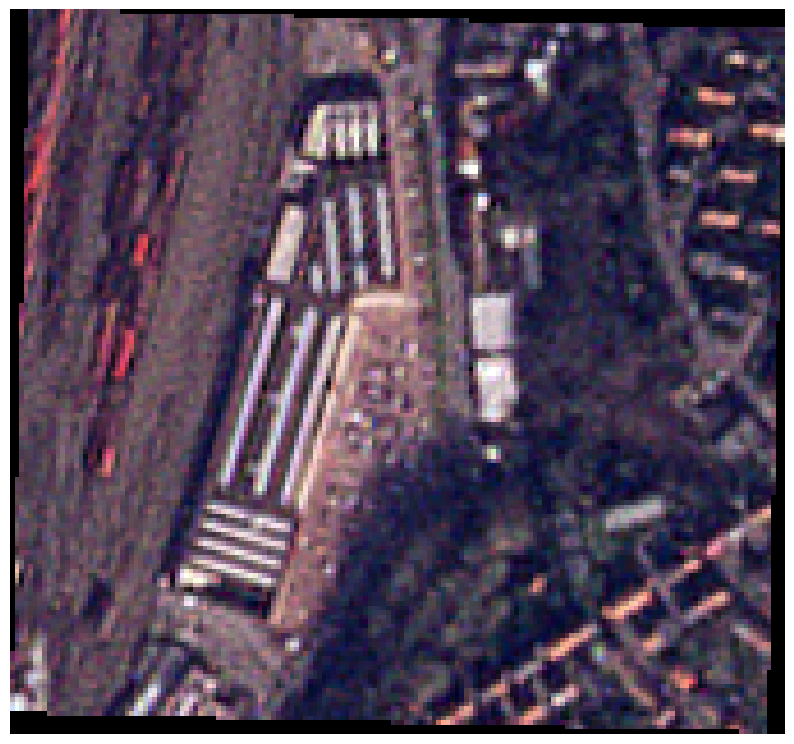

In [24]:
#plot single random image
plt.figure(figsize=(10,10))
img = rioxarray.open_rasterio(clean_3[0])
plt.imshow(img.data[0:3].transpose(1, 2, 0))
plt.axis('off')

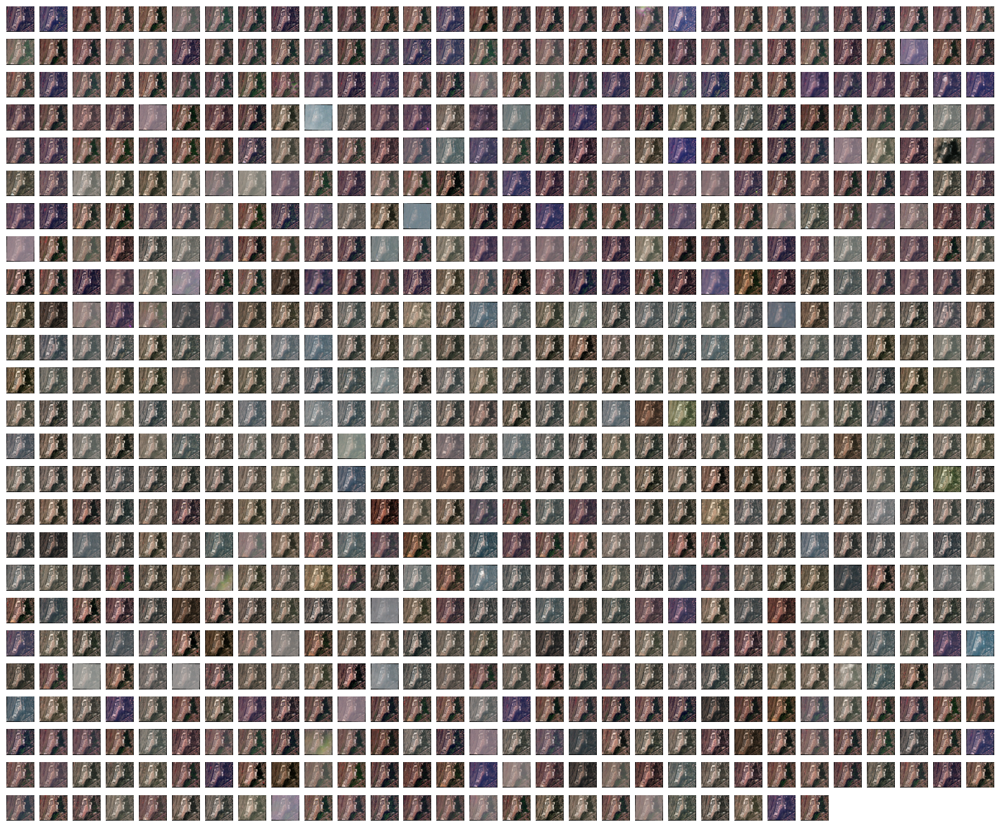

In [23]:
plt.figure(figsize=(20,20))
for i in range(len(clean_3)):
    plt.subplot(30,30,i+1)
    img = rioxarray.open_rasterio(clean_3[i])
    plt.imshow(img.data[0:3].transpose(1, 2, 0))
    plt.axis('off')

In [4]:
#create a dataframe with image path and label
df = label_csv(clean_3)

Class distribution in dataset: 0    652
1     93
Name: label, dtype: int64


In [9]:
#resnet 18 model training after train test split
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from torch.utils.data.sampler import SubsetRandomSampler
from torch.optim import Adam
from tqdm.auto import tqdm
import time
import copy

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

#train test split
train, test = train_test_split(df, test_size=0.2, random_state=42, stratify=df.label.values)
test.reset_index(inplace=True, drop=True)
train.reset_index(inplace=True, drop=True)
print("Train size:", train.shape)
print("Test size:", test.shape)
#print the class distribution in train and test set
print("Train class distribution:", train.label.value_counts())
print("Test class distribution:", test.label.value_counts())

cuda:0
Train size: (596, 3)
Test size: (149, 3)
Train class distribution: 0    522
1     74
Name: label, dtype: int64
Test class distribution: 0    130
1     19
Name: label, dtype: int64


In [15]:
#custom dataset class
class CustomDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform
    
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        img_path = self.df.image_path.values[idx]
        img = rioxarray.open_rasterio(img_path)
        img = img.data[0:3].transpose(1, 2, 0)
        label = self.df.label.values[idx]
        if self.transform:
            img = self.transform(img)
        return img, label

#data augmentation
train_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(degrees=45),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                        std=[0.229, 0.224, 0.225]),
])

test_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                        std=[0.229, 0.224, 0.225]),
])

#dataset and dataloader
train_dataset = CustomDataset(train, transform=train_transform)
test_dataset = CustomDataset(test, transform=test_transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

#model with resnet18 and fc layer pretrained on imagenet weights freezed

model = torchvision.models.resnet18(pretrained=True)
for param in model.parameters():
    param.requires_grad = True
model.fc = nn.Linear(512, 2)
model = model.to(device)

#loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = Adam(model.parameters(), lr=0.001)

#training and validation, also calculating AUC scores for train and test set
def train_model(model, criterion, optimizer, num_epochs=10):
    train_loss = []
    train_acc = []
    train_auc = []
    val_loss = []
    val_acc = []
    val_auc = []
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    for epoch in tqdm(range(num_epochs)):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)
        since = time.time()
        # Each epoch has a training and validation phase
        for phase in ['train', 'test']:
            if phase == 'train':
                model.train()  
            else:
                model.eval()   
            running_loss = 0.0
            running_corrects = 0
            y_pred = []
            y_true = []
            # Iterate over data.
            for inputs, labels in tqdm(eval(phase+'_loader')):
                inputs = inputs.to(device)
                labels = labels.to(device)
                # zero the parameter gradients
                optimizer.zero_grad()
                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    # Get model outputs and calculate loss
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    _, preds = torch.max(outputs, 1)
                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()
                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                y_pred.extend(preds.cpu().numpy())
                y_true.extend(labels.cpu().numpy())
            epoch_loss = running_loss / len(eval(phase+'_loader').dataset)
            epoch_acc = running_corrects.double() / len(eval(phase+'_loader').dataset)
            epoch_auc = roc_auc_score(y_true, y_pred)
            print('{} Loss: {:.4f} Acc: {:.4f} AUC: {:.4f}'.format(
                phase, epoch_loss, epoch_acc, epoch_auc))
            if phase == 'train':
                train_loss.append(epoch_loss)
                train_acc.append(epoch_acc)
                train_auc.append(epoch_auc)
            else:
                val_loss.append(epoch_loss)
                val_acc.append(epoch_acc)
                val_auc.append(epoch_auc)
            # deep copy the model
            if phase == 'test' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_auc = epoch_auc
                best_model_wts = copy.deepcopy(model.state_dict())
                torch.save(model.state_dict(), 'best_model.pt')
        print()
    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
    time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))
    print('Best val AUC: {:4f}'.format(best_auc))
    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, train_loss, train_acc, val_loss, val_acc, train_auc, val_auc


model, train_loss, train_acc, val_loss, val_acc, train_auc, val_auc = train_model(model, criterion, optimizer, num_epochs=10)




  0%|          | 0/10 [00:00<?, ?it/s]

Epoch 0/9
----------


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.6689 Acc: 0.8205 AUC: 0.5090


  0%|          | 0/5 [00:00<?, ?it/s]

test Loss: 0.4090 Acc: 0.8725 AUC: 0.5000

Epoch 1/9
----------


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.3907 Acc: 0.8758 AUC: 0.5058


  0%|          | 0/5 [00:00<?, ?it/s]

test Loss: 0.3662 Acc: 0.8725 AUC: 0.5000

Epoch 2/9
----------


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.3508 Acc: 0.8758 AUC: 0.5174


  0%|          | 0/5 [00:00<?, ?it/s]

test Loss: 0.3882 Acc: 0.8523 AUC: 0.8929

Epoch 3/9
----------


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.3014 Acc: 0.8876 AUC: 0.6343


  0%|          | 0/5 [00:00<?, ?it/s]

test Loss: 0.2561 Acc: 0.8725 AUC: 0.5000

Epoch 4/9
----------


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.2893 Acc: 0.8943 AUC: 0.6497


  0%|          | 0/5 [00:00<?, ?it/s]

test Loss: 0.4935 Acc: 0.7315 AUC: 0.8237

Epoch 5/9
----------


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.2427 Acc: 0.9178 AUC: 0.7269


  0%|          | 0/5 [00:00<?, ?it/s]

test Loss: 0.1356 Acc: 0.9530 AUC: 0.9731

Epoch 6/9
----------


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.2418 Acc: 0.8943 AUC: 0.7135


  0%|          | 0/5 [00:00<?, ?it/s]

test Loss: 0.2616 Acc: 0.9060 AUC: 0.9462

Epoch 7/9
----------


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.2365 Acc: 0.9060 AUC: 0.7144


  0%|          | 0/5 [00:00<?, ?it/s]

test Loss: 0.1096 Acc: 0.9664 AUC: 0.9134

Epoch 8/9
----------


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.2052 Acc: 0.9144 AUC: 0.7772


  0%|          | 0/5 [00:00<?, ?it/s]

test Loss: 0.1251 Acc: 0.9463 AUC: 0.8119

Epoch 9/9
----------


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.1834 Acc: 0.9346 AUC: 0.8293


  0%|          | 0/5 [00:00<?, ?it/s]

test Loss: 0.3532 Acc: 0.7852 AUC: 0.8769

Training complete in 0m 4s
Best val Acc: 0.966443
Best val AUC: 0.913360


In [21]:
train_acc_values = []
for index in range(len(train_acc)):
    train_acc_values.append(train_acc[index].item())

val_acc_values = []
for index in range(len(val_acc)):
    val_acc_values.append(val_acc[index].item())

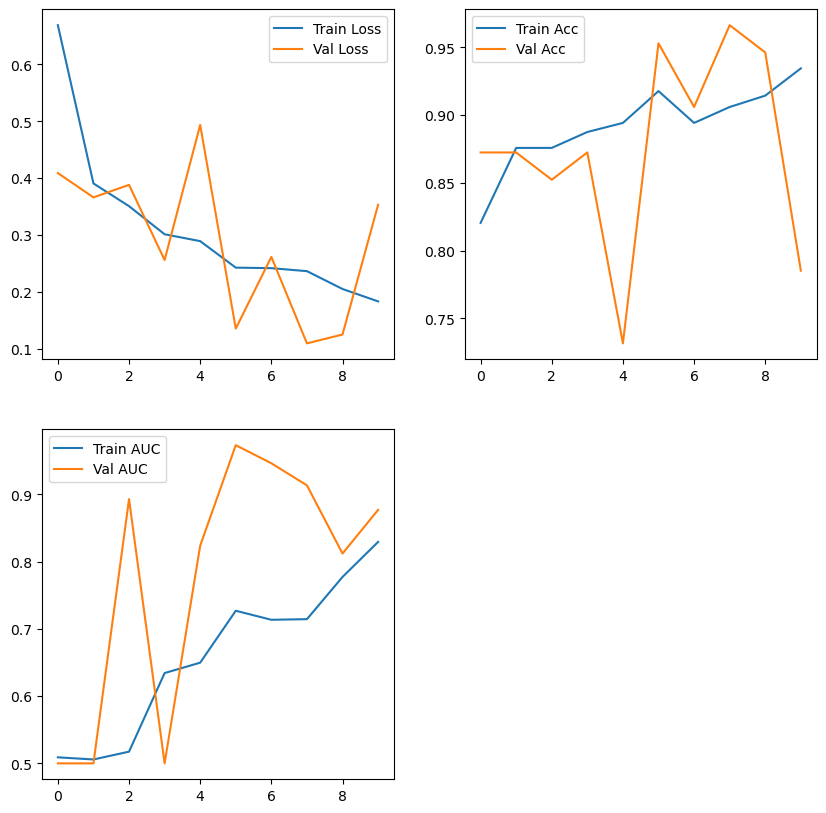

In [22]:
#plotting the loss and accuracy curves, AUC scores for train and test set
plt.figure(figsize=(10, 10))
plt.subplot(2, 2, 1)
plt.plot(train_loss, label='Train Loss')
plt.plot(val_loss, label='Val Loss')
plt.legend()
plt.subplot(2, 2, 2)
plt.plot(train_acc_values, label='Train Acc')
plt.plot(val_acc_values, label='Val Acc')
plt.legend()
plt.subplot(2, 2, 3)
plt.plot(train_auc, label='Train AUC')
plt.plot(val_auc, label='Val AUC')
plt.legend()
plt.show()


##### Old train loop

In [ ]:
# def train_model(model, criterion, optimizer, num_epochs=10):
#     since = time.time()
#     best_model_wts = copy.deepcopy(model.state_dict())
#     best_acc = 0.0
#     train_loss = []
#     val_loss = []
#     train_acc = []
#     val_acc = []
#     for epoch in range(num_epochs):
#         print(f"Epoch {epoch+1}/{num_epochs}")
#         print("-"*10)
#         running_loss = 0.0
#         running_corrects = 0
#         for inputs, labels in tqdm(train_loader):
#             inputs = inputs.to(device)
#             labels = labels.to(device)
#             optimizer.zero_grad()
#             outputs = model(inputs)
#             loss = criterion(outputs, labels)
#             _, preds = torch.max(outputs, 1)
#             loss.backward()
#             optimizer.step()
#             running_loss += loss.item()*inputs.size(0)
#             running_corrects += torch.sum(preds == labels.data)
#         epoch_loss = running_loss/len(train_dataset)
#         epoch_acc = running_corrects.double()/len(train_dataset)
#         train_loss.append(epoch_loss)
#         train_acc.append(epoch_acc)
#         print(f"Train loss: {epoch_loss:.4f} Train acc: {epoch_acc:.4f}")
#         model.eval()
#         running_loss = 0.0
#         running_corrects = 0
#         for inputs, labels in tqdm(test_loader):
#             inputs = inputs.to(device)
#             labels = labels.to(device)
#             with torch.no_grad():
#                 outputs = model(inputs)
#                 loss = criterion(outputs, labels)
#                 _, preds = torch.max(outputs, 1)
#                 running_loss += loss.item()*inputs.size(0)
#                 running_corrects += torch.sum(preds == labels.data)
#         epoch_loss = running_loss/len(test_dataset)
#         epoch_acc = running_corrects.double()/len(test_dataset)
#         val_loss.append(epoch_loss)
#         val_acc.append(epoch_acc)
#         print(f"Val loss: {epoch_loss:.4f} Val acc: {epoch_acc:.4f}")
#         if epoch_acc > best_acc:
#             best_acc = epoch_acc
#             best_model_wts = copy.deepcopy(model.state_dict())
#     time_elapsed = time.time() - since
#     print(f"Training complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
#     print(f"Best val acc: {best_acc:4f}")
#     model.load_state_dict(best_model_wts)
#     return model, train_loss, train_acc, val_loss, val_acc

#### Plots

In [41]:
inputs, classes = next(iter(test_loader)) 
inputs = inputs.to(device)
classes = classes.to(device)
outputs = model(inputs)
_, preds = torch.max(outputs, 1)
print(preds)
print(classes)

tensor([1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        1, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
tensor([1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        1, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')


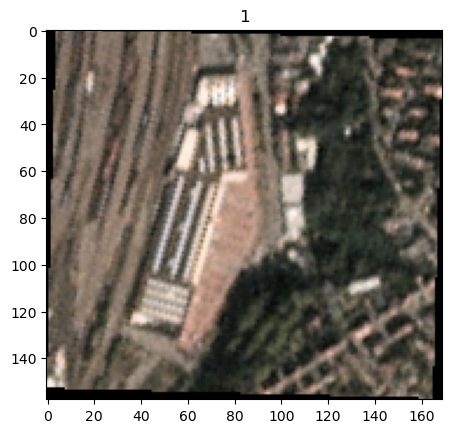

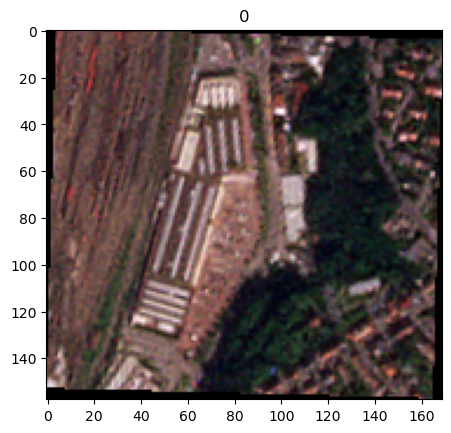

In [55]:
#renormalize the image with imagenet mean and std to display it
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
inp = std * inputs[0].cpu().numpy().transpose((1, 2, 0)) + mean
inp = np.clip(inp, 0, 1)
plt.imshow(inp)
plt.title(preds[0].item())
plt.show()

#plot another image
inp = std * inputs[1].cpu().numpy().transpose((1, 2, 0)) + mean
inp = np.clip(inp, 0, 1)
plt.imshow(inp)
plt.title(preds[1].item())
plt.show()


In [56]:
#save the model
torch.save(model.state_dict(), '/home/akansh-i2sc/Desktop/Research@societal/detect-car-LR/temp/models/model_bauhaus_exp_3.pt')

#### Grad cam on model

In [27]:
from pytorch_grad_cam import GradCAM, GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision.models import resnet18

In [93]:
model_test = resnet18(pretrained=False)
model_test.fc = nn.Linear(512, 2)
model_test.load_state_dict(torch.load('/home/akansh-i2sc/Desktop/Research@societal/detect-car-LR/temp/models/model_bauhaus_exp_3.pt'))

<All keys matched successfully>

Predicted label: 1
original class 1


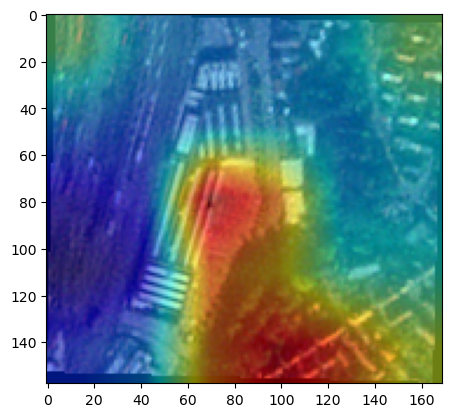

In [155]:
idx = 3
input_tensor = inputs[idx]
print("Predicted label:", preds[idx].cpu().item())
print("original class", classes[idx].cpu().item())
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

target_layers = [model_test.layer4[-1]]
cam = GradCAMPlusPlus(model=model_test, target_layers=target_layers, use_cuda=True)
grayscale_cam = cam(input_tensor=input_tensor.unsqueeze(0))

grayscale_cam = grayscale_cam[0, :]
grayscale_cam = 1-grayscale_cam

inp = std * input_tensor.cpu().numpy().transpose((1, 2, 0)) + mean

rgb_img = np.clip(inp, 0, 1)

visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=False)
plt.imshow(visualization)

Predicted label: 0
original class 0


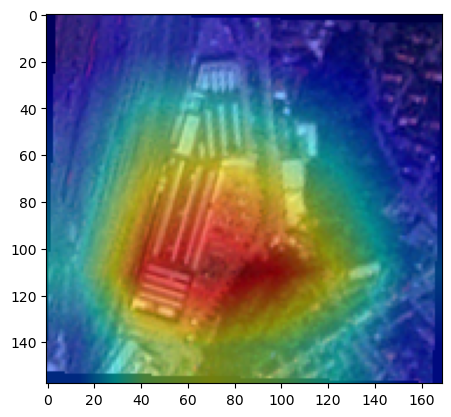

In [166]:
idx = 1
input_tensor = inputs[idx]
print("Predicted label:", preds[idx].cpu().item())
print("original class", classes[idx].cpu().item())
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

target_layers = [model_test.layer4[-1]]
cam = GradCAMPlusPlus(model=model_test, target_layers=target_layers, use_cuda=True)
grayscale_cam = cam(input_tensor=input_tensor.unsqueeze(0))

grayscale_cam = grayscale_cam[0, :]
grayscale_cam = 1-grayscale_cam

inp = std * input_tensor.cpu().numpy().transpose((1, 2, 0)) + mean

rgb_img = np.clip(inp, 0, 1)

visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=False)
plt.imshow(visualization)

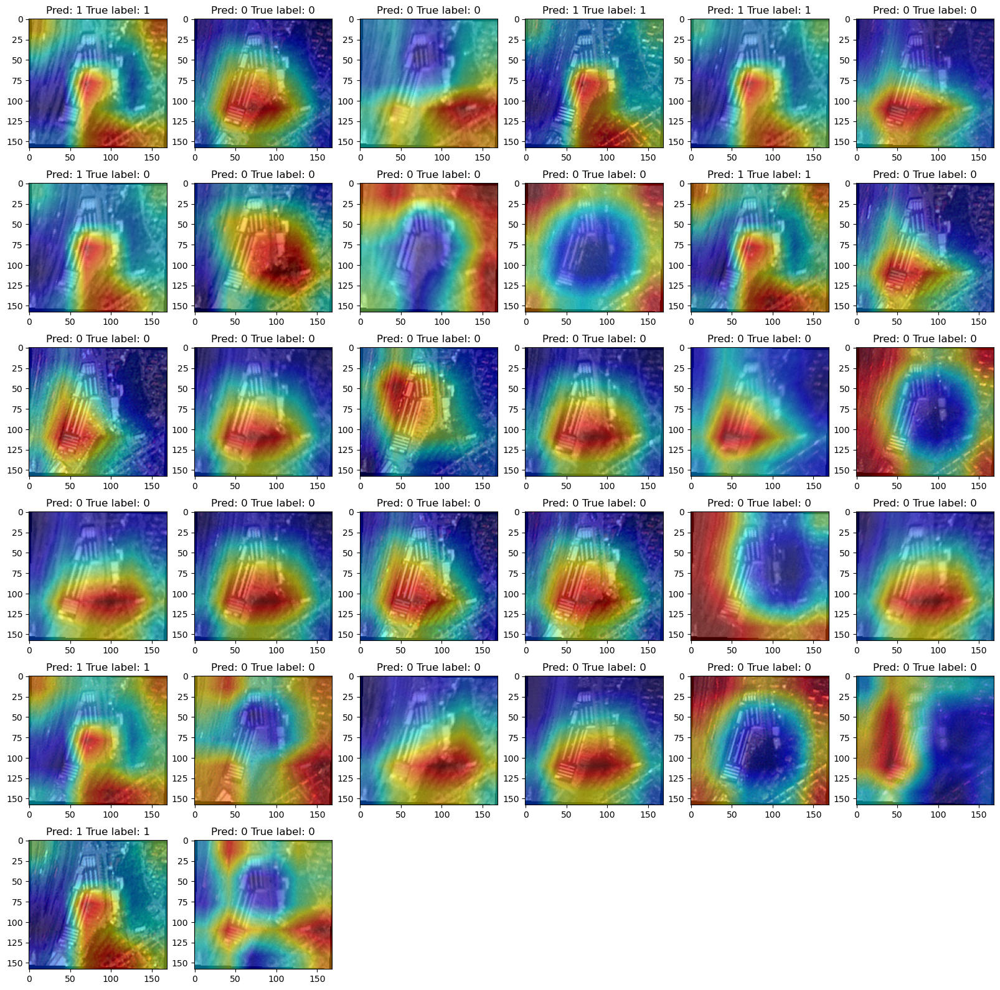

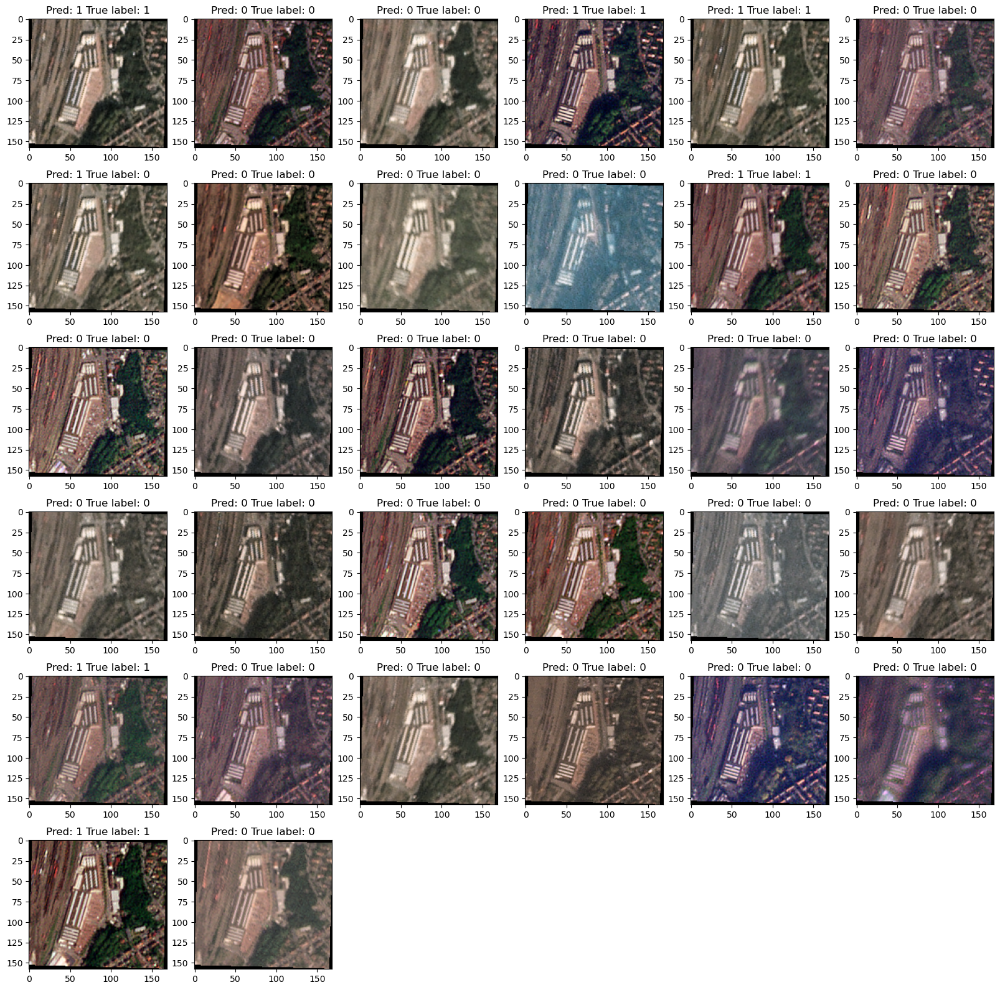

In [167]:
#plot all the images in test set with gradcam
plt.figure(figsize=(20, 20))
for idx in range(inputs.shape[0]):
    input_tensor = inputs[idx]
    target_layers = [model_test.layer4[-1]]
    cam = GradCAMPlusPlus(model=model_test, target_layers=target_layers, use_cuda=True)
    grayscale_cam = cam(input_tensor=input_tensor.unsqueeze(0))
    grayscale_cam = grayscale_cam[0, :]
    # grayscale_cam = 1-grayscale_cam
    inp = std * input_tensor.cpu().numpy().transpose((1, 2, 0)) + mean
    rgb_img = np.clip(inp, 0, 1)
    visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

    plt.subplot(6, 6, idx+1)
    plt.imshow(visualization)
    plt.title(f"Pred: {preds[idx].item()} True label: {classes[idx].item()}")
plt.show()

plt.figure(figsize=(20, 20))
for idx in range(inputs.shape[0]):
    input_tensor = inputs[idx]
    inp = std * input_tensor.cpu().numpy().transpose((1, 2, 0)) + mean
    rgb_img = np.clip(inp, 0, 1)
    plt.subplot(6, 6, idx+1)
    plt.imshow(rgb_img)
    plt.title(f"Pred: {preds[idx].item()} True label: {classes[idx].item()}")
plt.show()

    

#### inference of model

In [10]:
def create_median_image(images_path):

    first_img = rioxarray.open_rasterio(images_path[0])

    width, height = first_img.data[0:3].transpose(1, 2, 0).shape[0:2]
    num_images = len(images_path)

    red_values = np.zeros(( width,height, num_images), dtype=np.uint8)
    green_values = np.zeros(( width,height, num_images), dtype=np.uint8)
    blue_values = np.zeros(( width,height, num_images), dtype=np.uint8)


    for i,j in enumerate(images_path):
        img = rioxarray.open_rasterio(j).data[0:3].transpose(1, 2, 0)
        try:
            red_values[:, :, i], green_values[:, :, i], blue_values[:, :, i] = img[:, :, 0], img[:, :, 1], img[:, :, 2]
        except:
            pass
    
    red_median = np.median(red_values, axis=2)
    green_median = np.median(green_values, axis=2)
    blue_median = np.median(blue_values, axis=2)
    img_arr = np.uint8(np.dstack((red_median, green_median, blue_median)))
    median_image = Image.fromarray(img_arr)
    
    return img_arr, median_image

In [14]:
median_image, _ = create_median_image(glob.glob(img_path, recursive=True))

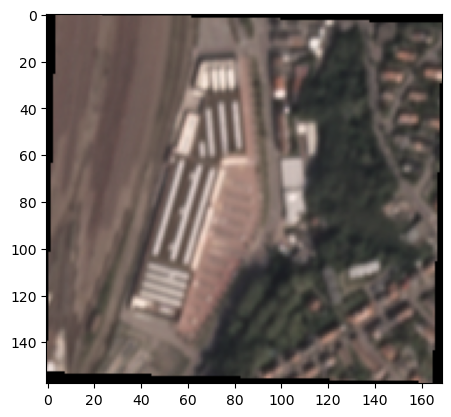

In [15]:
plt.imshow(median_image)

In [26]:
#inference on any image

from PIL import Image
from torchvision import transforms
import torch.nn.functional as F
from torch import nn
from torchvision.models import resnet18

test_transforms = transforms.Compose([transforms.ToPILImage(),
                                        transforms.ToTensor(),
                                        transforms.Normalize([0.485, 0.456, 0.406],
                                                                [0.229, 0.224, 0.225])])



img = test_transforms(median_image)
img = img.unsqueeze(0)
img = img.to("cpu")




#load the model
model_test = resnet18(pretrained=False)
model_test.fc = nn.Linear(512, 2)
model_test.load_state_dict(torch.load('/home/akansh-i2sc/Desktop/Research@societal/detect-car-LR/temp/models/model_bauhaus_exp_3.pt'))
model_test.eval()

#inference
with torch.no_grad():
    output = model_test(img)
    ps = F.softmax(output, dim=1)
    top_p, top_class = ps.topk(1, dim=1)
    print(top_class.item())




1


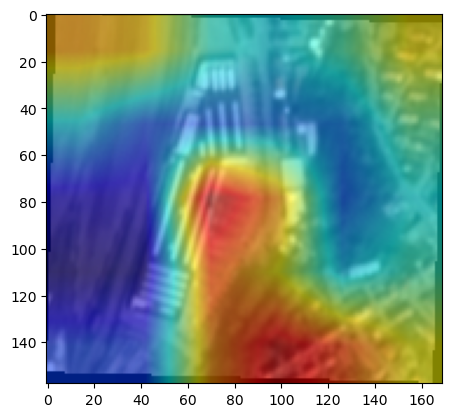

In [32]:
#gradcam on median image
input_tensor = img.squeeze(0)
preds = top_class
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

target_layers = [model_test.layer4[-1]]
cam = GradCAMPlusPlus(model=model_test, target_layers=target_layers, use_cuda=True)
grayscale_cam = cam(input_tensor=input_tensor.unsqueeze(0))

grayscale_cam = grayscale_cam[0, :]
grayscale_cam = 1-grayscale_cam

inp = std * input_tensor.cpu().numpy().transpose((1, 2, 0)) + mean

rgb_img = np.clip(inp, 0, 1)

visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=False)
plt.imshow(visualization)